In [14]:
using DrWatson
@quickactivate "Doran_etal_2022"
researchdir(args...) = projectdir("_research", args...)
pdir = plotsdir("UP7047treeplots")
mkpath(pdir)

using Phylo
using NewickTreeTools
using NewickTree: setsupport!
using Muon, CSV, DataFrames
using StatsPlots

In [ ]:
uniprot = readh5ad(joinpath(datadir(), "exp_pro", "UP7047", "2020_02_UP7047.h5ad"))
rowmeta = uniprot.obs[!, :]
close(uniprot.file)

In [18]:
spitree_newick = readnw(read(researchdir("runSPIonUP7047rows", "2020_02_UP7047-supporttree.nw"), String));
as_polytomy!(spitree_newick, fun=n->NewickTree.support(n)<0.5)
as_polytomy!(spitree_newick, fun=n->NewickTree.distance(n)<1e-8)
for n in prewalk(spitree_newick)
    NewickTree.setsupport!(n.data, NaN)
end
open(io->println(io, spitree_newick), researchdir("runSPIonUP7047rows", "2020_02_UP7047-trimmedtree.nw"), "w")
spitree_phylo = open(parsenewick, joinpath(researchdir(), "runSPIonUP7047rows", "2020_02_UP7047-trimmedtree.nw"))
sort!(spitree_phylo, rev=true)

RootedTree with 7047 tips, 13335 nodes and 13334 branches.
Leaf names are UP000015382, UP000217196, UP000257084, UP000000777, UP000075244, ... [7041 omitted] ... and UP000003922


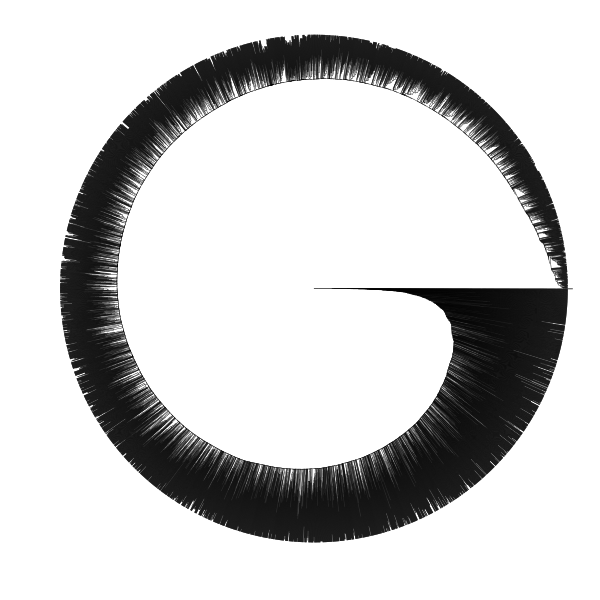

In [19]:
plot(spitree_phylo, treetype=:fan, 
    size = (600, 600), 
    linewidth=.4, 
    showtips=false)

In [20]:
savefig(joinpath(pdir, "fulltrimmed_spitree.svg"))

In [21]:
#  "UP000056419"  "Bacteroides stercoris" (+4)
#  "UP000003089"  "Bacteroides nordii" (+2)
#  "UP000095409"  "Blautia obeum"
#  "UP000000625"  "Escherichia coli" (+6)
#  "UP000029079"  "Weissella ceti" (+7)
startingleafid = "UP000056419"

"UP000056419"

In [23]:
leaves = NewickTree.getleaves(spitree_newick);
# leaves = NewickTree.getleaves(alttree);

In [24]:
leaf = leaves[name.(leaves) .== startingleafid][1]
lp = parent(leaf)
for i in 1:3
    lp = parent(lp)
end
leafparent = lp;
# subtree = collectiveLCA(spitree, blautiaIDs);
plotting_subtree = parsenewick(nwstr(leafparent))
sort!(plotting_subtree, rev=true)
plotIDS = getnodename.(plotting_subtree, Phylo.getleaves(plotting_subtree));
newnames = rowmeta[indexin(plotIDS,rowmeta.proteomeID), :Species];

In [25]:
plotIDS

16-element Vector{String}:
 "UP000018018"
 "UP000018068"
 "UP000018372"
 "UP000018098"
 "UP000017916"
 "UP000018121"
 "UP000195527"
 "UP000018392"
 "UP000056419"
 "UP000262405"
 "UP000319088"
 "UP000279562"
 "UP000008630"
 "UP000018228"
 "UP000018063"
 "UP000018150"

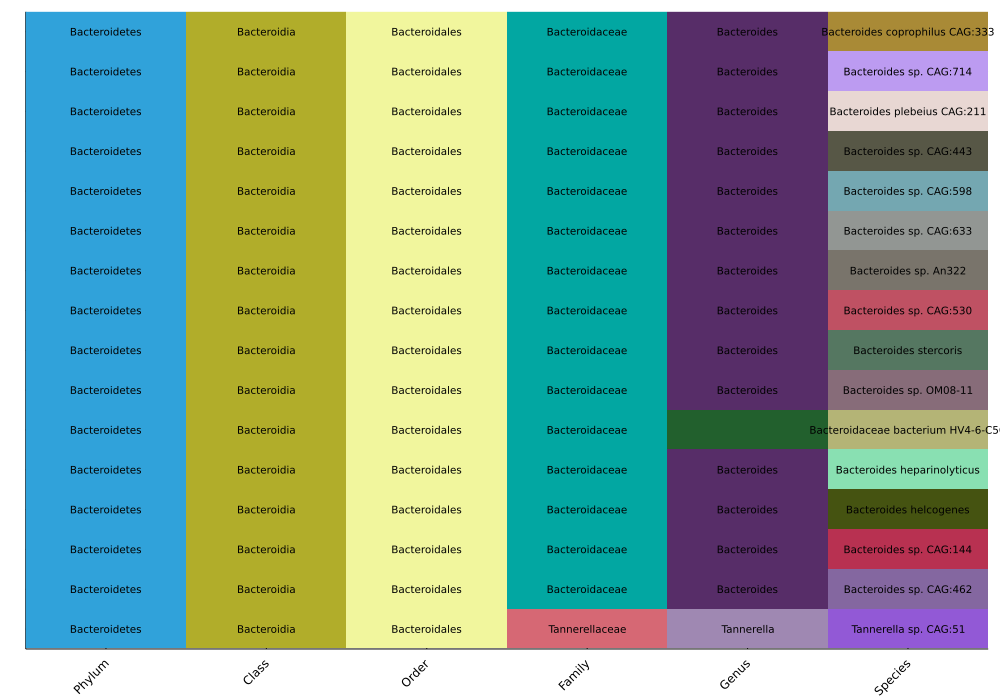

In [27]:
subtreemeta = rowmeta[reverse(indexin(plotIDS, rowmeta.proteomeID)), [:Phylum, :Class, :Order, :Family, :Genus, :Species]]
plot(size=(1000,700), yticks=(1:size(subtreemeta,1),""), xticks=(1:size(subtreemeta,2), names(subtreemeta)), xrotation=45)
heatmap!(Matrix(subtreemeta), colorbar=false, c=:glasbey_hv_n256)
ys = vcat([repeat([i], size(subtreemeta,2))' for i in 1:size(subtreemeta, 1)]...)
xs = hcat([repeat([i], size(subtreemeta,1)) for i in 1:size(subtreemeta, 2)]...);
annotate!(xs[:], ys[:], text.(Matrix(subtreemeta)[:], 7))

In [33]:
savefig(joinpath(pdir, "$(startingleafid)_SPIsubtree_heatmap.svg"))

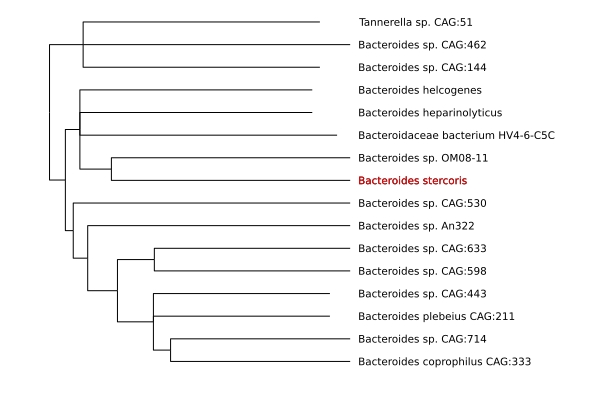

In [35]:
hcat(plotIDS,newnames);
plot(plotting_subtree, treetype=:dendrogram, size = (600, 400), showtips=false, rightmargin=50Plots.Measures.mm)
annotate!(ones(length(plotIDS))*1.7, 1:length(plotIDS), text.(newnames, :black, :left, 7),)
annotate!(1.7, 9, text.(newnames[9], :red, :left, 7),) # bacteriodes
# annotate!(1.7, 18, text.(newnames[18], :red, :left, 7),) # blautia
# annotate!(.95, 1, text.(newnames[1], :red, :left, 7),) # weissella
# annotate!(2.5, 1, text.(newnames[1], :red, :left, 7),) # ecoli
# annotate!(2.7, 8, text.(newnames[8], :red, :left, 7),) # bacteriodes nordii

In [36]:
savefig(joinpath(pdir, "$(startingleafid)_SPIsubtree_dendro.svg"))

In [39]:
# alttree = readnw(read(joinpath(researchdir(), "UP7047altdists", "UP7047_ogg_euclidean-supporttree.nw"), String));
# alttree = readnw(read(joinpath(researchdir(), "UP7047altdists", "UP7047_ogg_cityblock-supporttree.nw"), String));
# alttree = readnw(read(joinpath(researchdir(), "UP7047altdists", "UP7047_svd_euclidean-supporttree.nw"), String));
# alttree = readnw(read(joinpath(researchdir(), "UP7047altdists", "UP7047_svd_cityblock-supporttree.nw"), String));
for filename in [
    "UP7047_ogg_euclidean-supporttree.nw",
    "UP7047_ogg_cityblock-supporttree.nw",
    "UP7047_svd_euclidean-supporttree.nw",
    "UP7047_svd_cityblock-supporttree.nw"]

    alttree = readnw(read(joinpath(researchdir(), "UP7047altdists", filename), String));
    as_polytomy!(alttree, fun=n->NewickTree.support(n)<0.5)
    as_polytomy!(alttree, fun=n->NewickTree.distance(n)<1e-8)
    for n in prewalk(alttree)
        NewickTree.setsupport!(n.data, NaN)
    end
    open(io->println(io, alttree), researchdir("UP7047altdists", first(split(filename, "-")) * "-trimmedtree.nw"), "w")
end

In [59]:
for filename in [
    "UP7047_ogg_euclidean-trimmedtree.nw",
    "UP7047_ogg_cityblock-trimmedtree.nw",
    "UP7047_svd_euclidean-trimmedtree.nw",
    "UP7047_svd_cityblock-trimmedtree.nw",
    "UP7047_seq_fastANI-tree.nw"]

    alttree = readnw(read(joinpath(researchdir(), "UP7047altdists", filename), String));
    leaves = NewickTree.getleaves(alttree);

    leafid = "UP000056419"
    leaf = leaves[name.(leaves) .== leafid][1]
    lp = parent(leaf)
    for i in 1:3
        lp = parent(lp)
    end
    leafparent = lp;
    # subtree = collectiveLCA(spitree, blautiaIDs);
    plotting_subtree = parsenewick(nwstr(leafparent))
    sort!(plotting_subtree, rev=true)
    plotIDS = getnodename.(plotting_subtree, Phylo.getleaves(plotting_subtree));
    newnames = rowmeta[indexin(plotIDS,rowmeta.proteomeID), :Species];
    subtreemeta = rowmeta[reverse(indexin(plotIDS, rowmeta.proteomeID)), [:Phylum, :Class, :Order, :Family, :Genus, :Species]]
    
    @show filename, nrow(subtreemeta)
    
    plot(size=(1000,700), yticks=(1:size(subtreemeta,1),""), xticks=(1:size(subtreemeta,2), names(subtreemeta)), xrotation=45)
    heatmap!(Matrix(subtreemeta), colorbar=false, c=:glasbey_hv_n256)
    ys = vcat([repeat([i], size(subtreemeta,2))' for i in 1:size(subtreemeta, 1)]...)
    xs = hcat([repeat([i], size(subtreemeta,1)) for i in 1:size(subtreemeta, 2)]...);
    p = annotate!(xs[:], ys[:], text.(Matrix(subtreemeta)[:], 6))
    
    savefig(p, joinpath(pdir, leafid * "-" * first(split(filename,"-")) * "-heatmap.svg"))

    hcat(plotIDS,newnames);
    plot(title=filename)
    plot!(plotting_subtree, treetype=:dendrogram, size = (600, 400), showtips=false, rightmargin=50Plots.Measures.mm)
    maxdepth = maximum(map(patristic_distance, NewickTree.getleaves(leafparent), [leafparent]))    
    annotate!(zeros(length(plotIDS)) .+ maxdepth .+ (maxdepth * 0.05), 1:length(plotIDS), text.(newnames, :black, :left, 7),)
    p = annotate!(maxdepth + (maxdepth * 0.05), findfirst(==(leafid), plotIDS), text.(newnames[findfirst(==(leafid), plotIDS)], :red, :left, 7),) # bacteriodes stercoris

    savefig(p, joinpath(pdir, leafid * "-" * first(split(filename,"-")) * "-dendro.svg"))

end

(filename, nrow(subtreemeta)) = ("UP7047_ogg_euclidean-trimmedtree.nw", 17)
(filename, nrow(subtreemeta)) = ("UP7047_ogg_euclidean-trimmedtree.nw", 17)
(filename, nrow(subtreemeta)) = ("UP7047_ogg_cityblock-trimmedtree.nw", 18)
(filename, nrow(subtreemeta)) = ("UP7047_svd_euclidean-trimmedtree.nw", 531)
(filename, nrow(subtreemeta)) = ("UP7047_svd_cityblock-trimmedtree.nw", 546)
(filename, nrow(subtreemeta)) = ("UP7047_seq_fastANI-tree.nw", 6047)


In [57]:
maxdepth = maximum(map(patristic_distance, NewickTree.getleaves(leafparent), [leafparent]))

99.99167872094196

In [ ]:
hcat(plotIDS,newnames);
plot(title="OGG euclidean")
plot!(plotting_subtree, treetype=:dendrogram, size = (600, 400), showtips=false, rightmargin=50Plots.Measures.mm)
annotate!(ones(length(plotIDS))*75, 1:length(plotIDS), text.(newnames, :black, :left, 7),)
annotate!(75, 10, text.(newnames[10], :red, :left, 7),) # bacteriodes stercoris
# annotate!(1.7, 18, text.(newnames[18], :red, :left, 7),) # blautia
# annotate!(.95, 1, text.(newnames[1], :red, :left, 7),) # weissella
# annotate!(2.5, 1, text.(newnames[1], :red, :left, 7),) # ecoli
# annotate!(2.7, 8, text.(newnames[8], :red, :left, 7),) # bacteriodes nordii



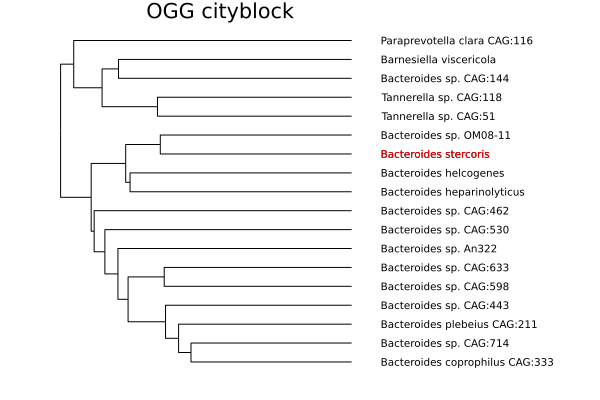

In [111]:
hcat(plotIDS,newnames);
plot(title="OGG cityblock")
plot!(plotting_subtree, treetype=:dendrogram, size = (600, 400), showtips=false, rightmargin=50Plots.Measures.mm)
annotate!(ones(length(plotIDS))*1475, 1:length(plotIDS), text.(newnames, :black, :left, 7),)
annotate!(1475, 12, text.(newnames[12], :red, :left, 7),) # bacteriodes stercoris
# annotate!(1.7, 18, text.(newnames[18], :red, :left, 7),) # blautia
# annotate!(.95, 1, text.(newnames[1], :red, :left, 7),) # weissella
# annotate!(2.5, 1, text.(newnames[1], :red, :left, 7),) # ecoli
# annotate!(2.7, 8, text.(newnames[8], :red, :left, 7),) # bacteriodes nordii

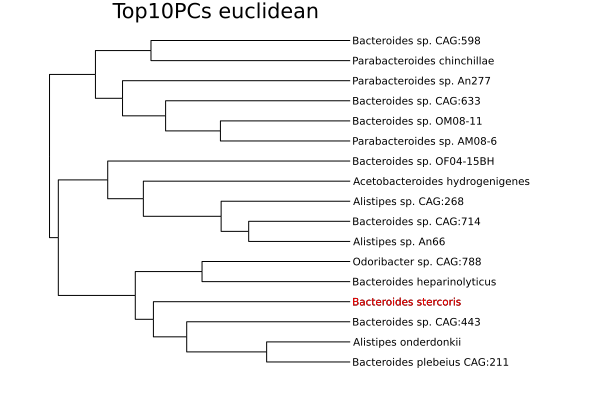

In [128]:
hcat(plotIDS,newnames);
plot(title="Top10PCs euclidean")
plot!(plotting_subtree, treetype=:dendrogram, size = (600, 400), showtips=false, rightmargin=50Plots.Measures.mm)
annotate!(ones(length(plotIDS))*.007, 1:length(plotIDS), text.(newnames, :black, :left, 7),)
annotate!(.007, 4, text.(newnames[4], :red, :left, 7),) # bacteriodes stercoris
# annotate!(1.7, 18, text.(newnames[18], :red, :left, 7),) # blautia
# annotate!(.95, 1, text.(newnames[1], :red, :left, 7),) # weissella
# annotate!(2.5, 1, text.(newnames[1], :red, :left, 7),) # ecoli
# annotate!(2.7, 8, text.(newnames[8], :red, :left, 7),) # bacteriodes nordii

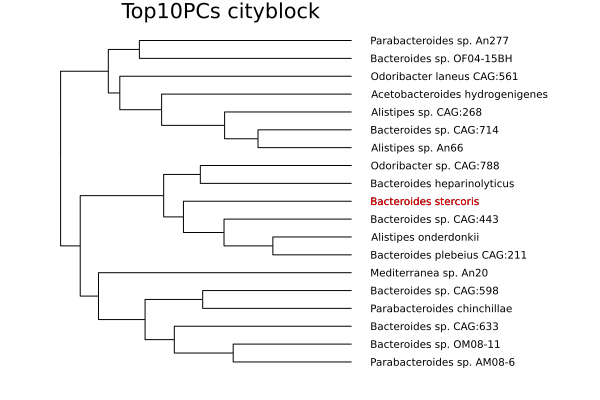

In [141]:
hcat(plotIDS,newnames);
plot(title="Top10PCs cityblock")
plot!(plotting_subtree, treetype=:dendrogram, size = (600, 400), showtips=false, rightmargin=50Plots.Measures.mm)
annotate!(ones(length(plotIDS))*.02, 1:length(plotIDS), text.(newnames, :black, :left, 7),)
annotate!(.02, 10, text.(newnames[10], :red, :left, 7),) # bacteriodes stercoris
# annotate!(1.7, 18, text.(newnames[18], :red, :left, 7),) # blautia
# annotate!(.95, 1, text.(newnames[1], :red, :left, 7),) # weissella
# annotate!(2.5, 1, text.(newnames[1], :red, :left, 7),) # ecoli
# annotate!(2.7, 8, text.(newnames[8], :red, :left, 7),) # bacteriodes nordii